<a href="https://colab.research.google.com/github/lucaspanwang/3.14-h5/blob/master/Lab1_Pan_Wang.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from numpy import ndarray
from matplotlib.patches import Rectangle
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

#1. Create the Algorithm with the 1st Photo

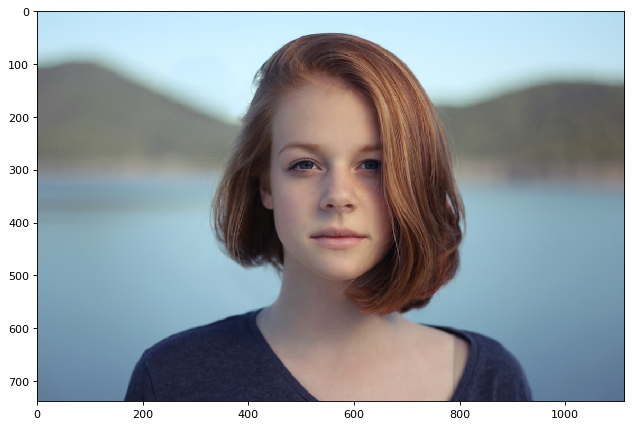

In [170]:
photo1 = imread('/content/drive/MyDrive/images/lab1/photo1.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo1);

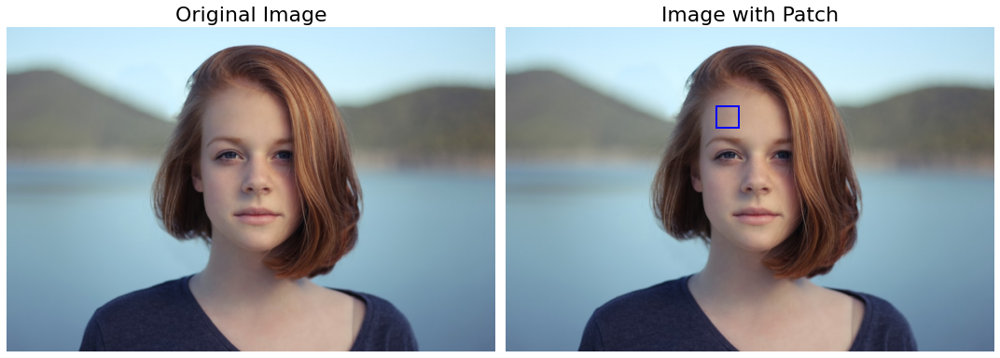

In [171]:
def showImageWithPatch(image, patch_coor):
  fig, ax = plt.subplots(1,2, figsize=(15,7))
  ax[0].imshow(image)
  ax[0].set_title('Original Image', fontsize = 22)
  ax[0].set_axis_off()
  ax[1].imshow(image)
  ax[1].add_patch(Rectangle((patch_coor[2], patch_coor[0]),
                            patch_coor[1] - patch_coor[0],
                            patch_coor[3] - patch_coor[2],
                            linewidth=2, edgecolor='b', facecolor='none'));
  ax[1].set_title('Image with Patch', fontsize = 22)
  ax[1].set_axis_off()
  fig.tight_layout()
showImageWithPatch(photo1, [180,230,480,530])

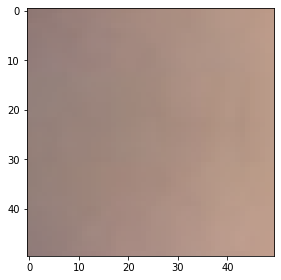

In [174]:
patch1 = photo1[180:230,480:530]
imshow(patch1);

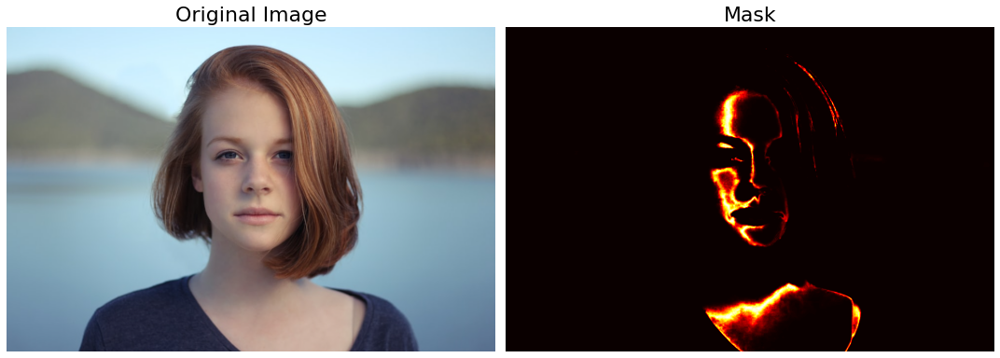

In [175]:
def gaussian(p,mean,std):
    return np.exp(-(p-mean)**2/(2*std**2))*(1/(std*((2*np.pi)**0.5)))
def rg_chroma_patch(image, patch, mean = 1, std = 1):
    image_r = image[:,:,0] /image.sum(axis=2)
    image_g = image[:,:,1] /image.sum(axis=2)
    
    patch_r = patch[:,:,0] / patch.sum(axis=2)
    patch_g = patch[:,:,1] / patch.sum(axis=2)
    
    std_patch_r = np.std(patch_r.flatten())
    mean_patch_r = np.mean(patch_r.flatten())
    std_patch_g = np.std(patch_g.flatten())
    mean_patch_g = np.mean(patch_g.flatten())
    masked_image_r = gaussian(image_r, mean_patch_r, std_patch_r)
    masked_image_g = gaussian(image_g, mean_patch_g, std_patch_g)
    final_mask = masked_image_r * masked_image_g
    fig, ax = plt.subplots(1,2, figsize=(15,7))
    ax[0].imshow(image)
    ax[0].set_title('Original Image', fontsize = 22)
    ax[0].set_axis_off()
    
    #clean the mask using area_opening
    ax[1].imshow(final_mask, cmap = 'hot');
    ax[1].set_title('Mask', fontsize = 22)
    ax[1].set_axis_off()
    fig.tight_layout()
    
    return final_mask
final_mask1 = rg_chroma_patch(photo1, patch1)

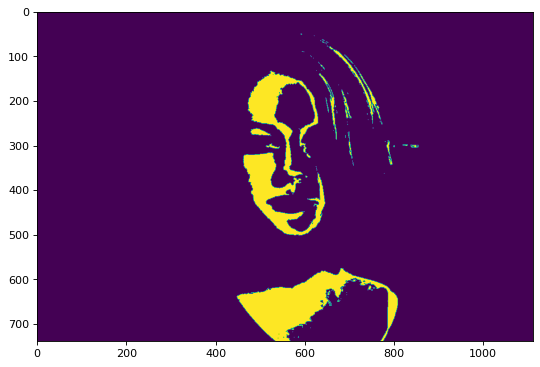

In [176]:
binarized_mask1 = final_mask1 > final_mask1.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask1)
plt.show()

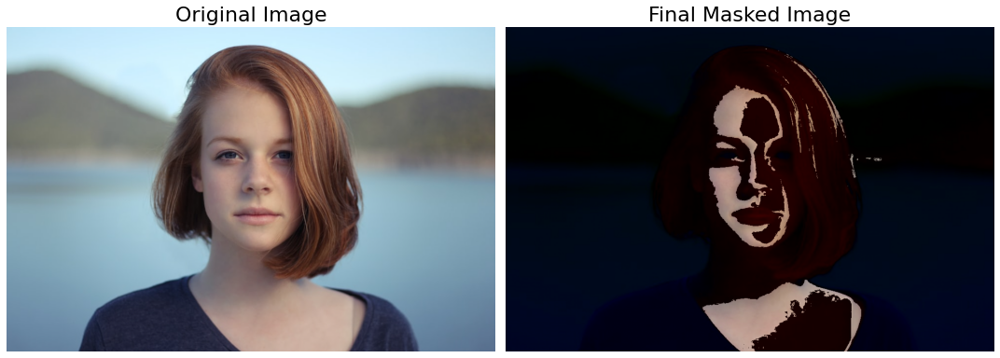

In [177]:
def apply_mask(image,mask):
    yuv_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    yuv_image[:,:,0] = yuv_image[:,:,0] * mask 
    
    masked_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2RGB)
    
    fig, ax = plt.subplots(1,2, figsize=(15,7))
    ax[0].imshow(image)
    ax[0].set_title('Original Image', fontsize = 22)
    ax[0].set_axis_off()
    
    ax[1].imshow(masked_image);
    ax[1].set_title('Final Masked Image', fontsize = 22)
    ax[1].set_axis_off()
    fig.tight_layout()
apply_mask(photo1, binarized_mask1)

# 2. Develop the Algorithm with the First 2 Photos

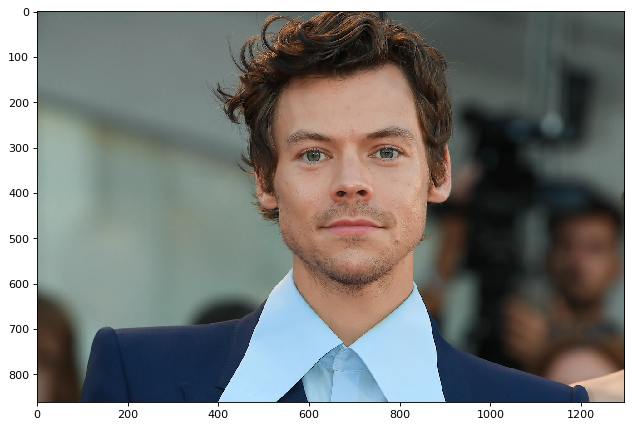

In [178]:
photo2 = imread('/content/drive/MyDrive/images/lab1/photo2.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo2);

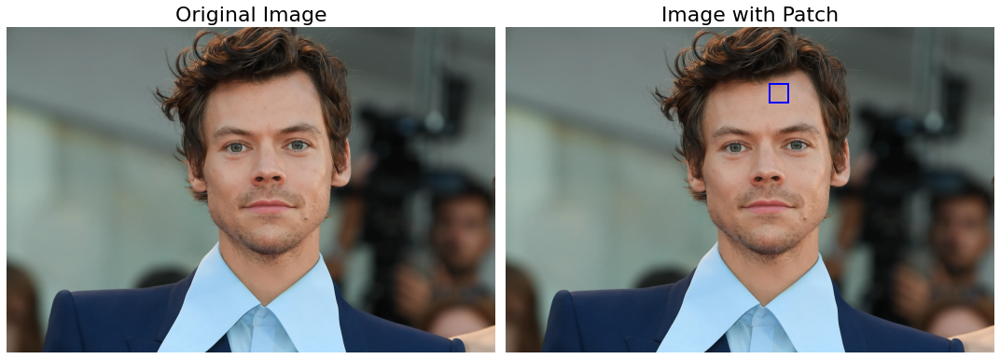

In [179]:
showImageWithPatch(photo2, [150,200,700,750])

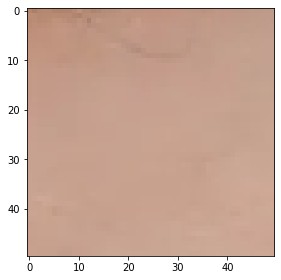

In [180]:
patch2 = photo2[150:200,700:750]
imshow(patch2);

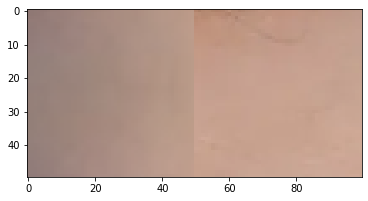

In [181]:
patches2 = cv2.hconcat([patch1, patch2])
plt.imshow(patches2)
plt.show()

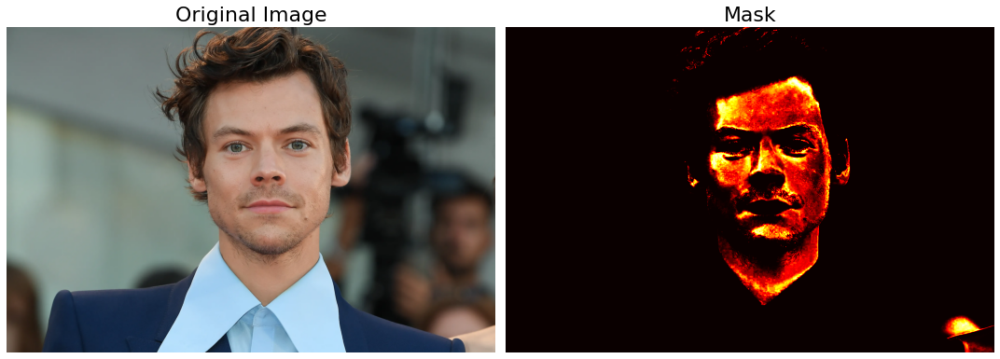

In [182]:
final_mask2 = rg_chroma_patch(photo2, patches2)

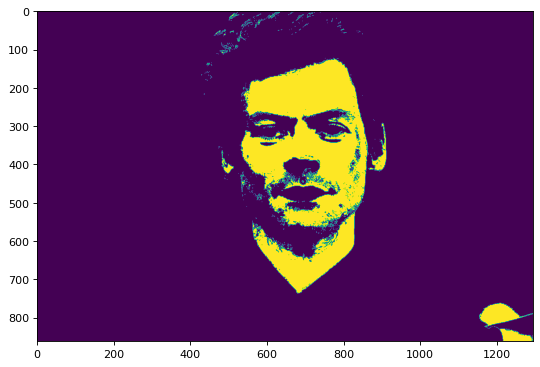

In [183]:
binarized_mask2 = final_mask2 > final_mask2.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask2)
plt.show()

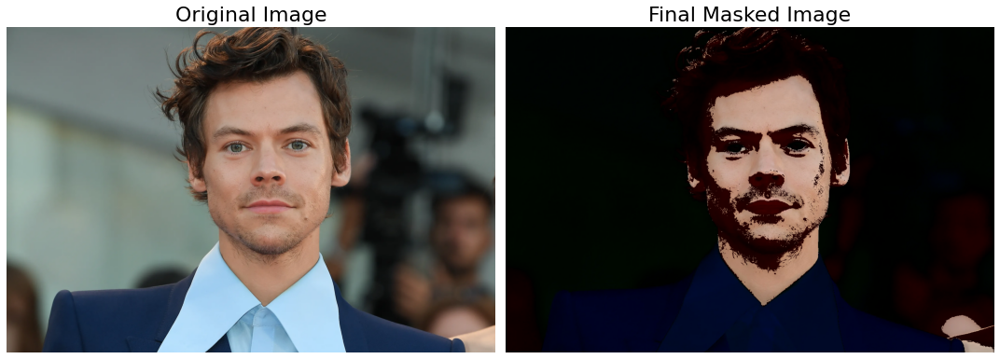

In [184]:
apply_mask(photo2, binarized_mask2)

# 3. Develop the Algorithm with the First 3 Photos

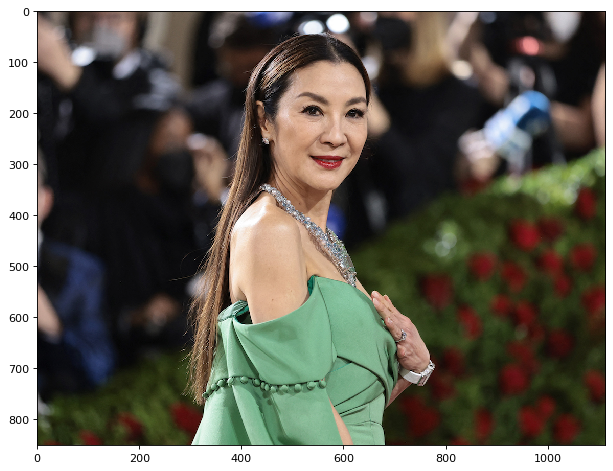

In [185]:
photo3 = imread('/content/drive/MyDrive/images/lab1/photo3.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo3);

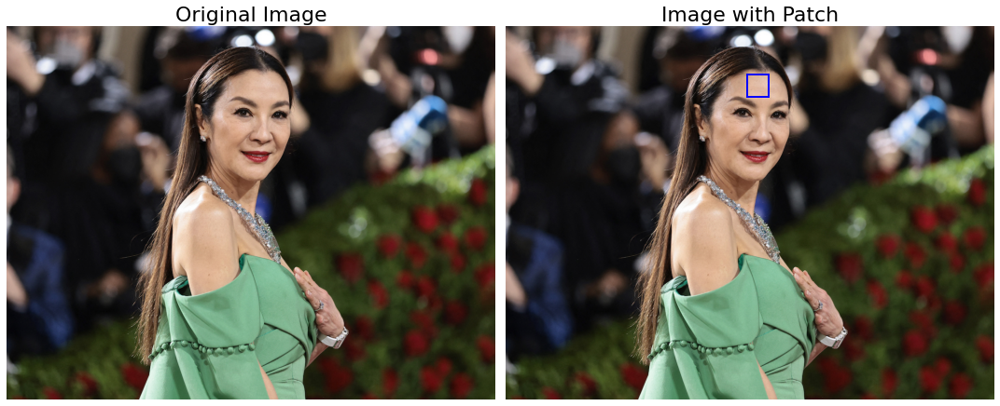

In [186]:
showImageWithPatch(photo3, [110,160,550,600])

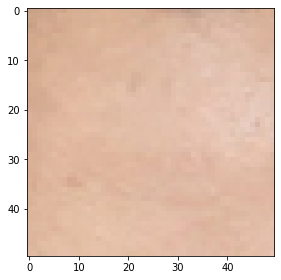

In [187]:
patch3 = photo3[110:160,550:600]
imshow(patch3);

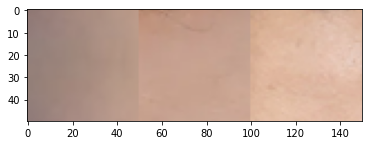

In [188]:
patches3 = cv2.hconcat([patch1, patch2, patch3])
plt.imshow(patches3)
plt.show()

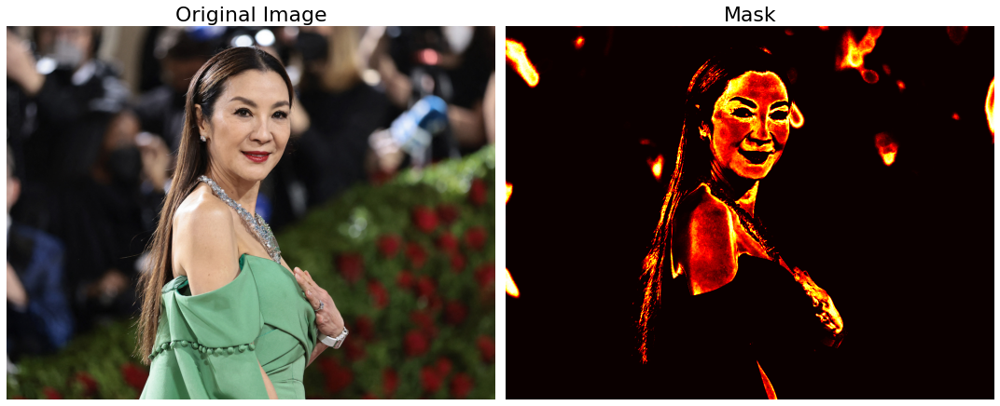

In [189]:
final_mask3 = rg_chroma_patch(photo3, patches3)

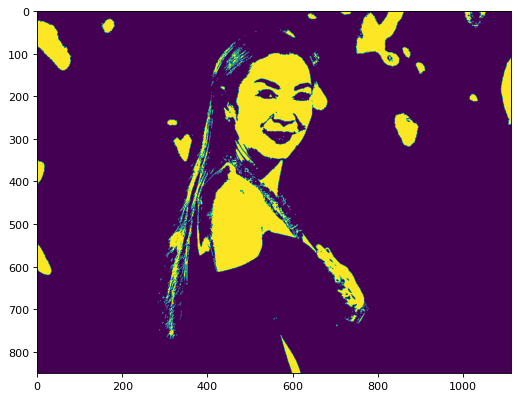

In [190]:
binarized_mask3 = final_mask3 > final_mask3.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask3)
plt.show()

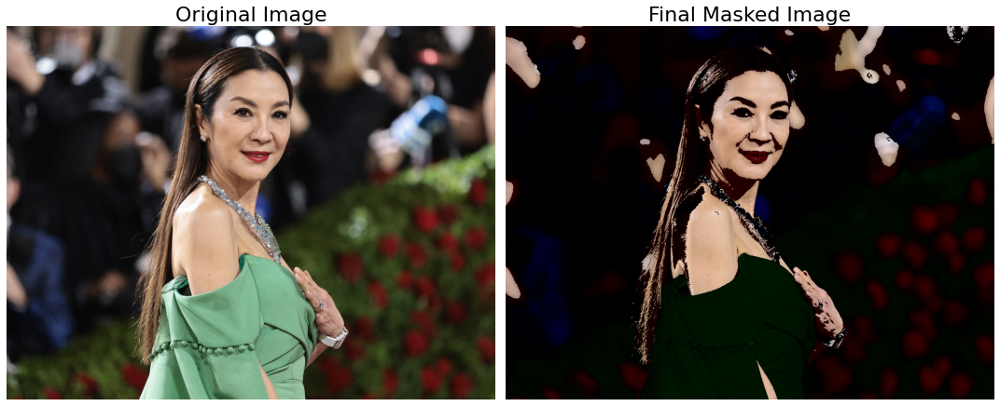

In [192]:
apply_mask(photo3, binarized_mask3)

# 4. Develop the Algorithm with the First 4 Photos

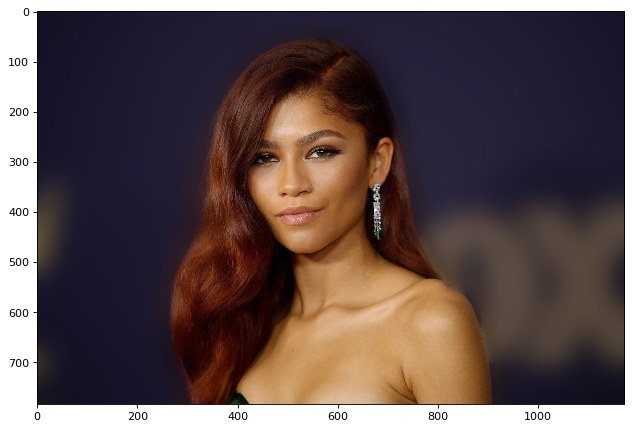

In [218]:
photo4 = imread('/content/drive/MyDrive/images/lab1/photo4.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo4);

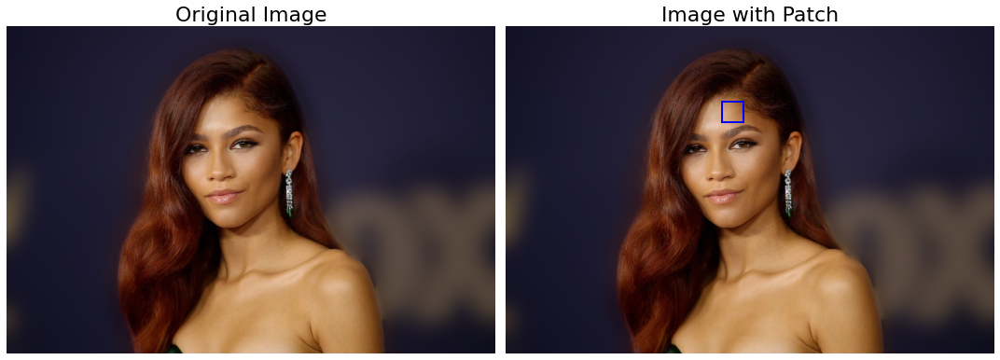

In [219]:
showImageWithPatch(photo4, [180,230,520,570])

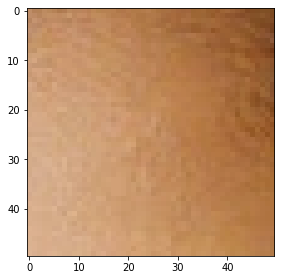

In [220]:
patch4 = photo4[180:230,520:570]
imshow(patch4);

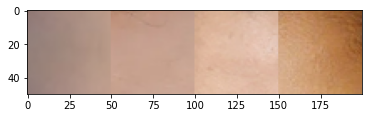

In [221]:
patches4 = cv2.hconcat([patch1, patch2, patch3, patch4])
plt.imshow(patches4)
plt.show()

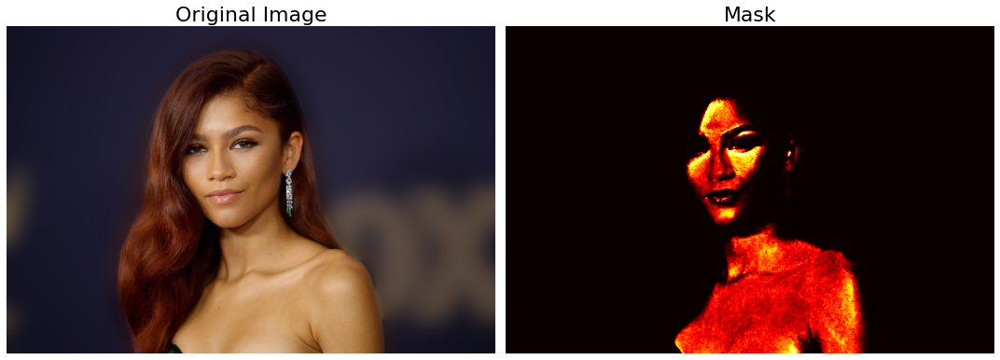

In [222]:
final_mask4 = rg_chroma_patch(photo4, patches4)

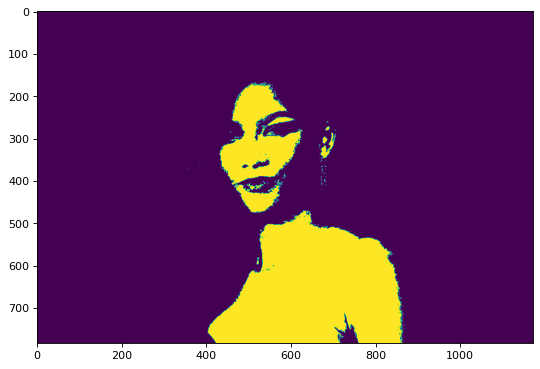

In [223]:
binarized_mask4 = final_mask4 > final_mask4.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask4)
plt.show()

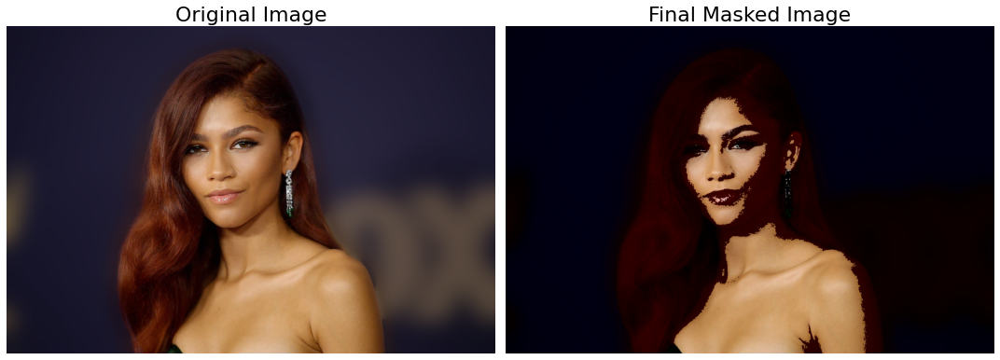

In [224]:
apply_mask(photo4, binarized_mask4)

# 5. Develop the Algorithm with the First 5 Photos

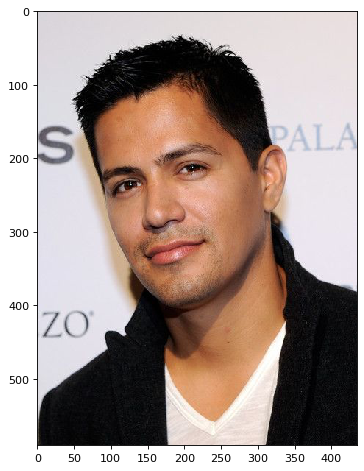

In [240]:
photo5 = imread('/content/drive/MyDrive/images/lab1/photo5.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo5);

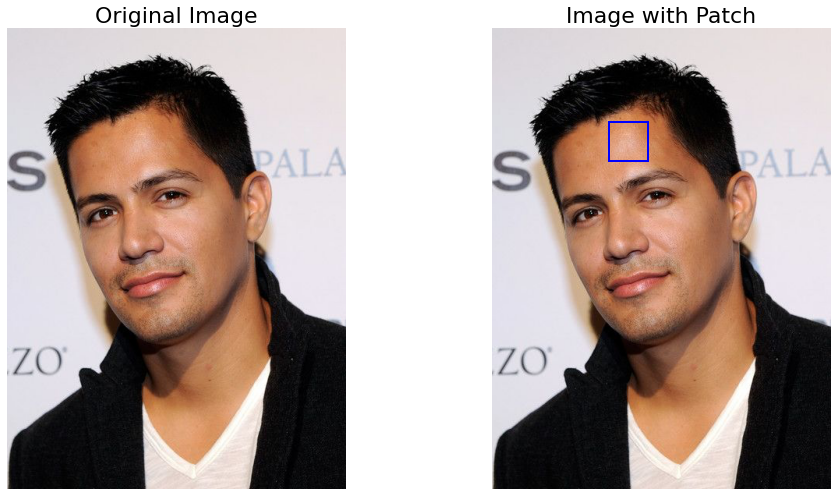

In [245]:
showImageWithPatch(photo5, [120,170,150,200])

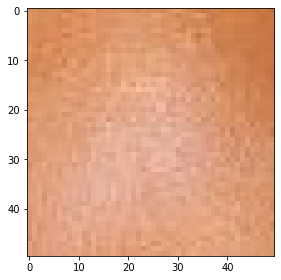

In [246]:
patch5 = photo5[120:170,150:200]
imshow(patch5);

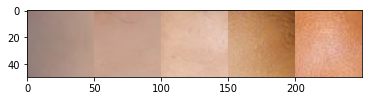

In [247]:
patches5 = cv2.hconcat([patch1, patch2, patch3, patch4, patch5])
plt.imshow(patches5)
plt.show()

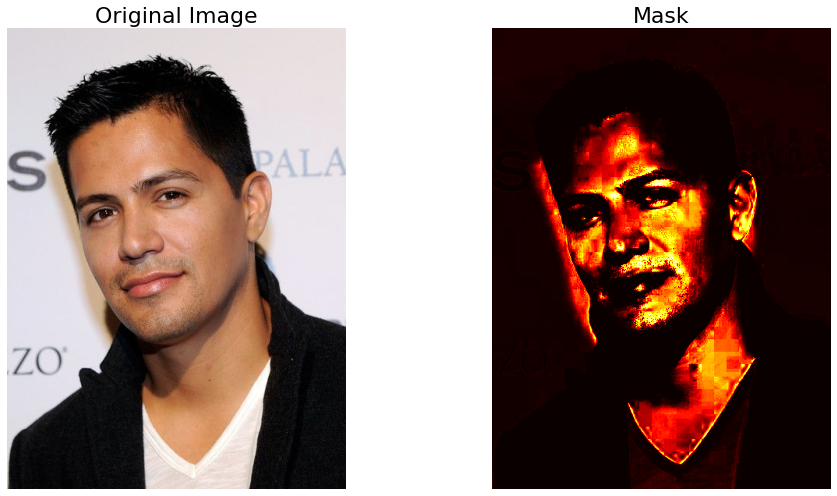

In [248]:
final_mask5 = rg_chroma_patch(photo5, patches5)

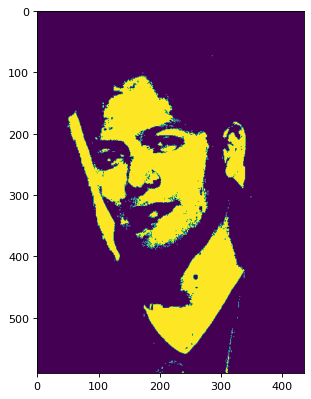

In [249]:
binarized_mask5 = final_mask5 > final_mask5.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask5)
plt.show()

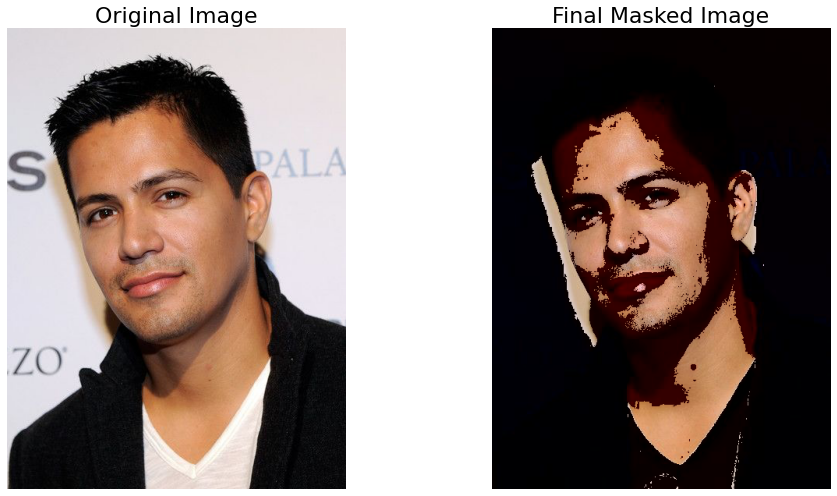

In [250]:
apply_mask(photo5, binarized_mask5)

# 6. Develop the Algorithm with the First 6 Photos

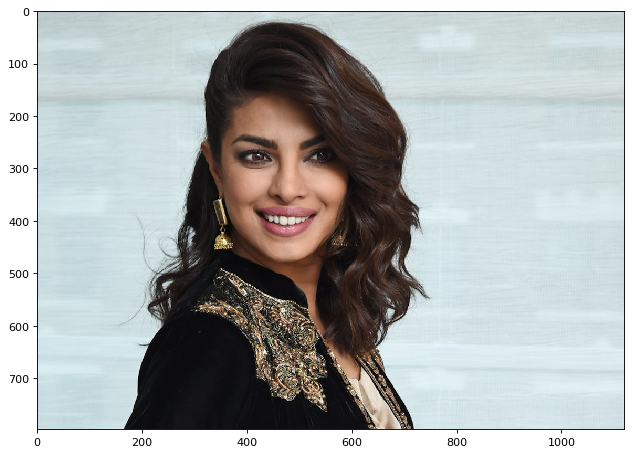

In [251]:
photo6 = imread('/content/drive/MyDrive/images/lab1/photo6.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo6);

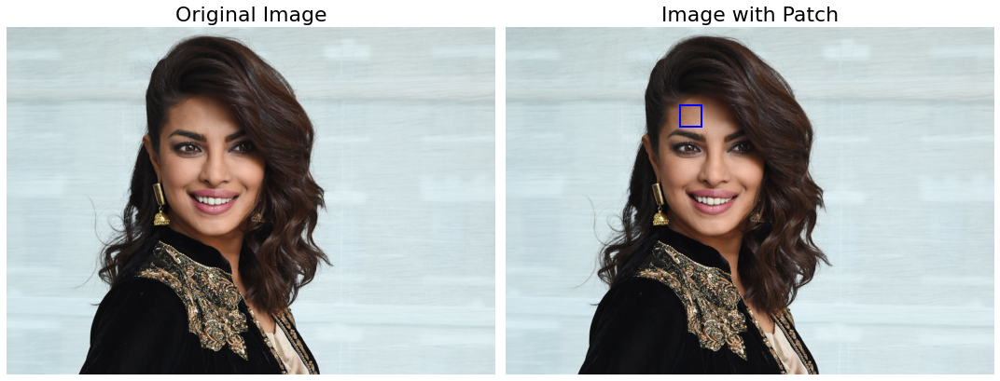

In [256]:
showImageWithPatch(photo6, [180,230,400,450])

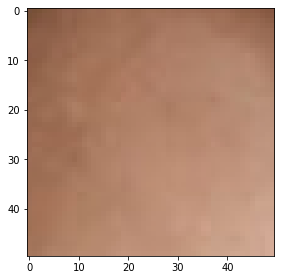

In [258]:
patch6 = photo6[180:230,400:450]
imshow(patch6);

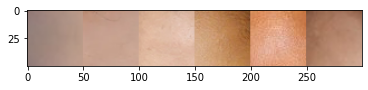

In [259]:
patches6 = cv2.hconcat([patch1, patch2, patch3, patch4, patch5, patch6])
plt.imshow(patches6)
plt.show()

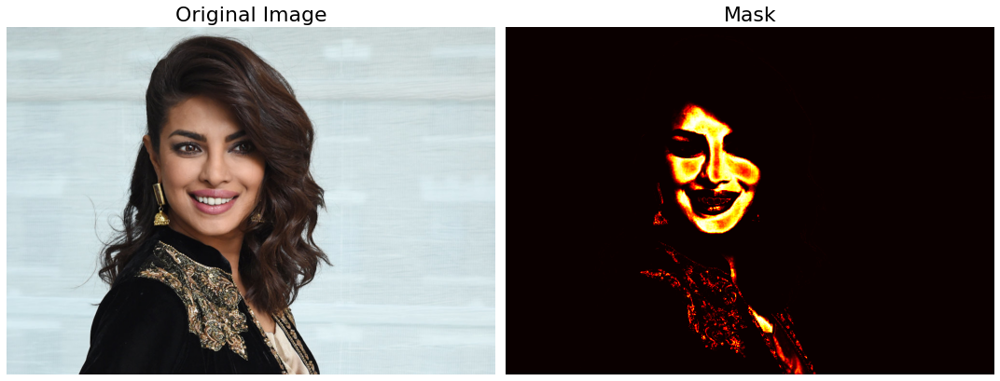

In [260]:
final_mask6 = rg_chroma_patch(photo6, patches6)

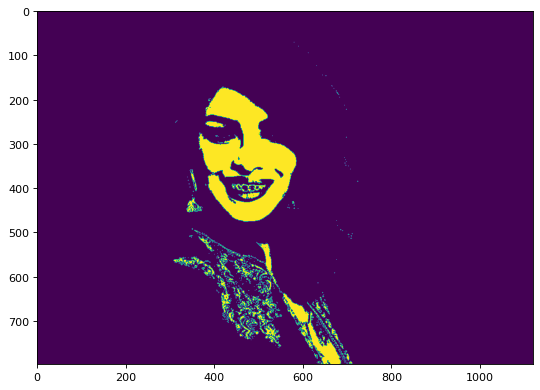

In [262]:
binarized_mask6 = final_mask6 > final_mask6.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask6)

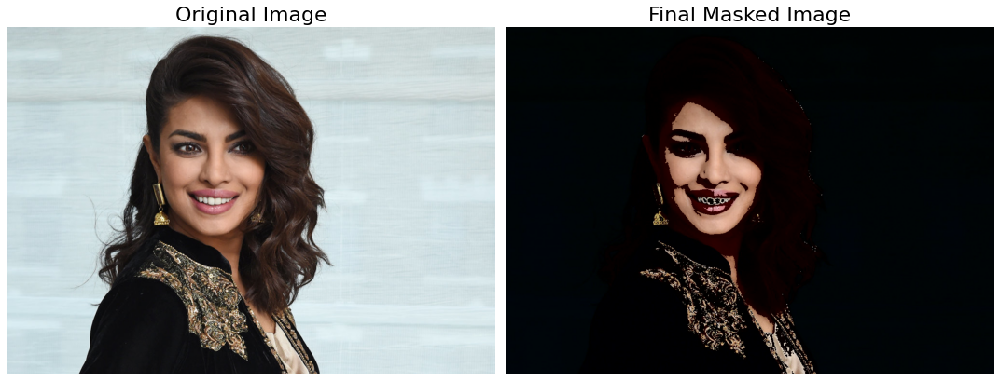

In [263]:
apply_mask(photo6, binarized_mask6)

# 7. Develop the Algorithm with 7 Photos

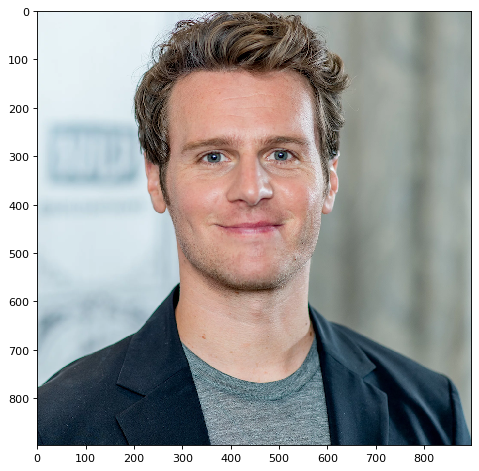

In [265]:
photo7 = imread('/content/drive/MyDrive/images/lab1/photo7.png')
plt.figure(num=None, figsize=(8, 6), dpi=80)
imshow(photo7);

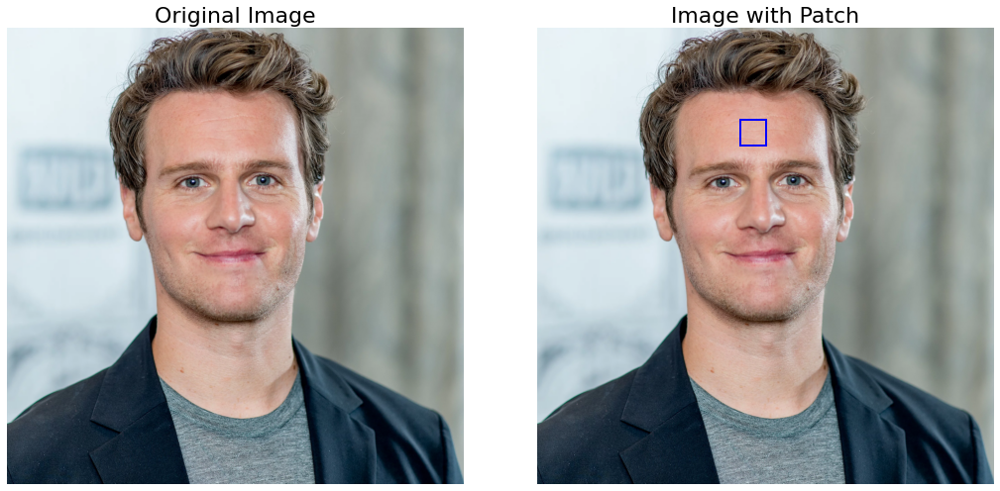

In [266]:
showImageWithPatch(photo7, [180,230,400,450])

/usr/local/lib/python3.8/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


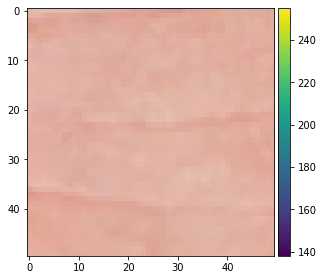

In [268]:
patch7 = photo7[180:230,400:450]
imshow(patch7);

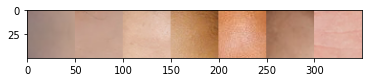

In [315]:
final_patches = cv2.hconcat([patch1, patch2, patch3, patch4, patch5, patch6, patch7])
plt.imshow(final_patches)
plt.show()

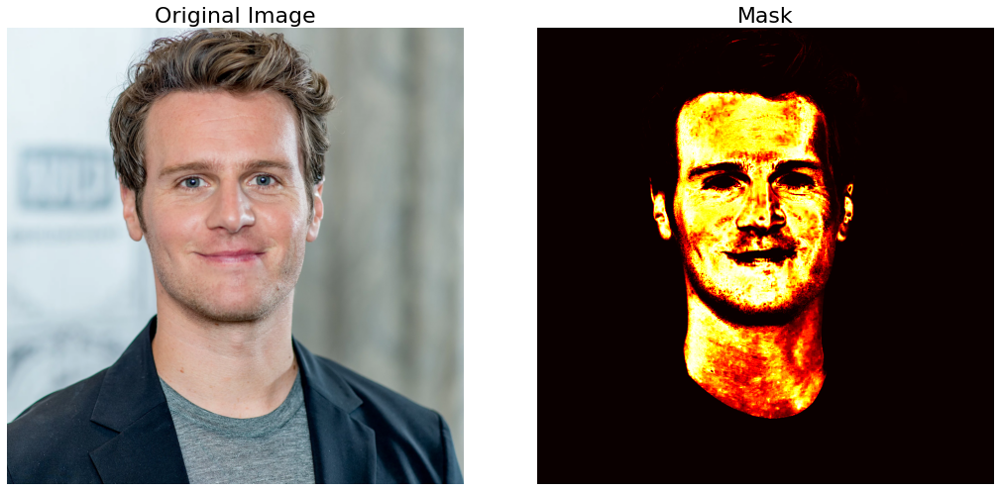

In [271]:
final_mask7 = rg_chroma_patch(photo7, final_patches)

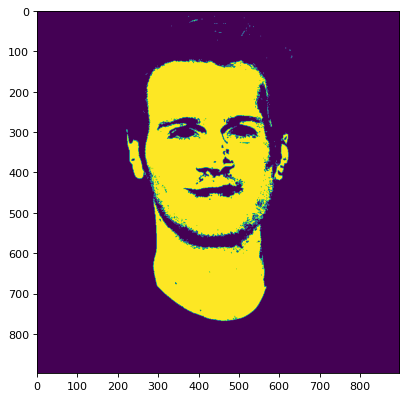

In [273]:
binarized_mask7 = final_mask7 > final_mask7.mean()
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(binarized_mask7)

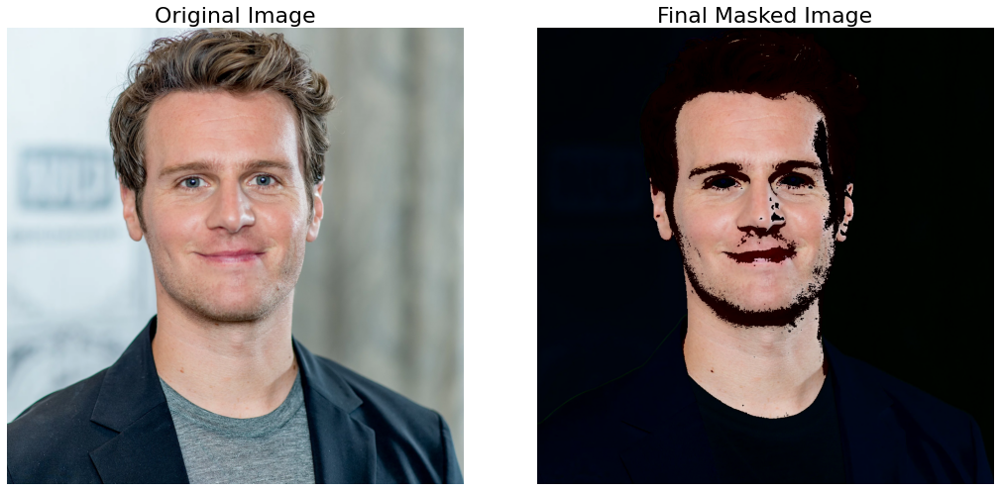

In [274]:
apply_mask(photo7, binarized_mask7)

# 8. Conclude with a Final Algorithm

In [282]:
def rg_chroma_patch_final(image, patch, mean = 1, std = 1):
    image_r = image[:,:,0] /image.sum(axis=2)
    image_g = image[:,:,1] /image.sum(axis=2)
    
    patch_r = patch[:,:,0] / patch.sum(axis=2)
    patch_g = patch[:,:,1] / patch.sum(axis=2)
    
    std_patch_r = np.std(patch_r.flatten())
    mean_patch_r = np.mean(patch_r.flatten())
    std_patch_g = np.std(patch_g.flatten())
    mean_patch_g = np.mean(patch_g.flatten())
    masked_image_r = gaussian(image_r, mean_patch_r, std_patch_r)
    masked_image_g = gaussian(image_g, mean_patch_g, std_patch_g)
    final_mask = masked_image_r * masked_image_g
    
    return final_mask

In [283]:
def finalSolution(image):
    final_mask = rg_chroma_patch_final(image, final_patches)
    binarized_mask = final_mask > final_mask.mean()
    apply_mask(image, binarized_mask)

# First Test


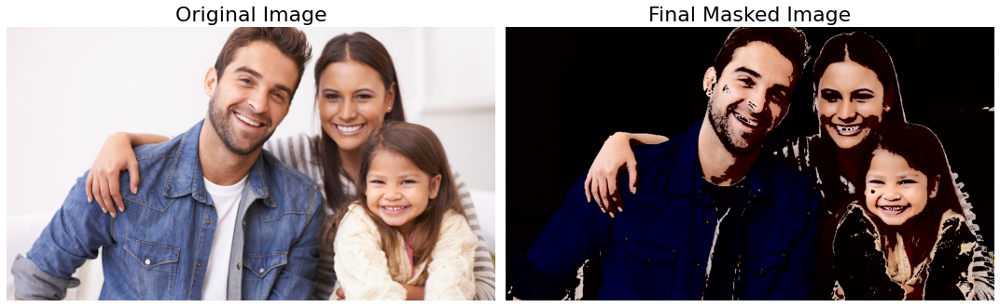

In [284]:
test1 = imread('/content/drive/MyDrive/images/lab1/test1.png')
finalSolution(test1)

Make the image 15% brighter (100% is completely white)

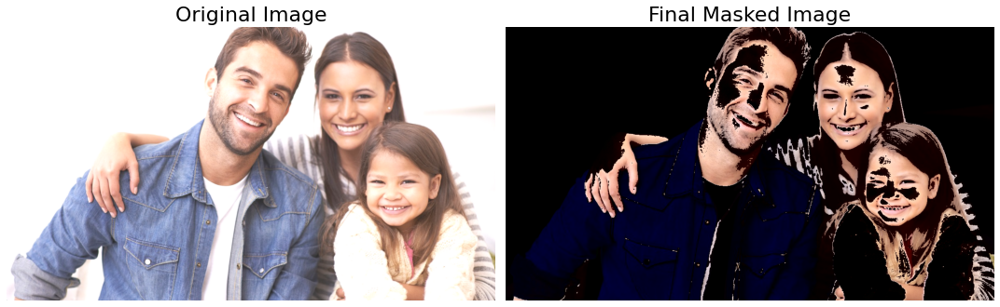

In [297]:
test1_brighter = cv2.convertScaleAbs(test1, beta=38)
finalSolution(test1_brighter)

Make the image 15% darker (100% is completely black)

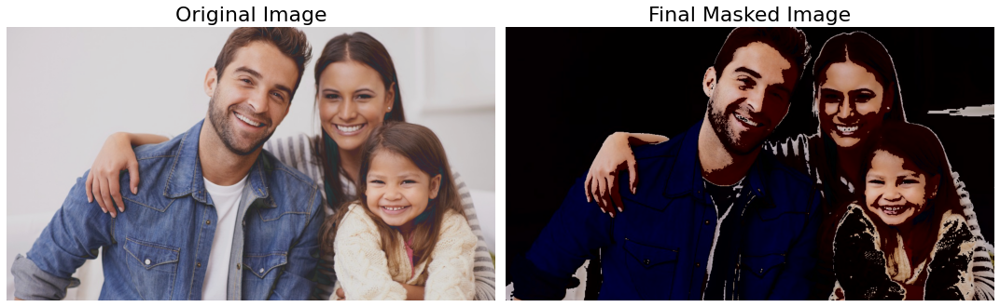

In [314]:
test1_darker = cv2.convertScaleAbs(test1, beta=-38)
finalSolution(test1_darker)

# Second Test


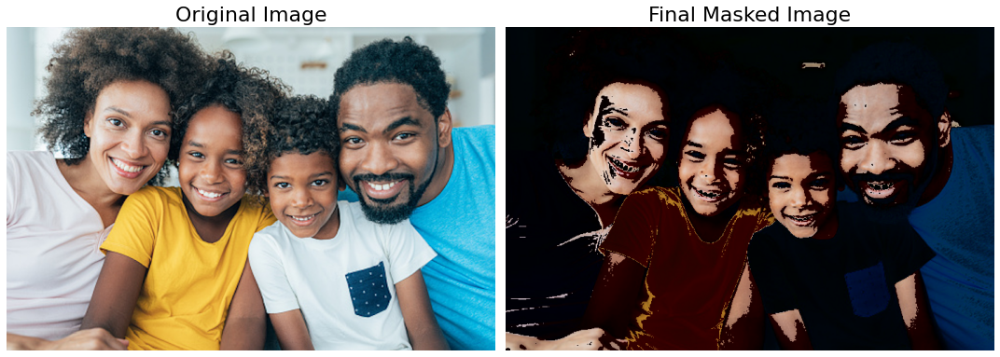

In [299]:
test2 = imread('/content/drive/MyDrive/images/lab1/test2.png')
finalSolution(test2) 

Make the image 15% brighter (100% is completely white)

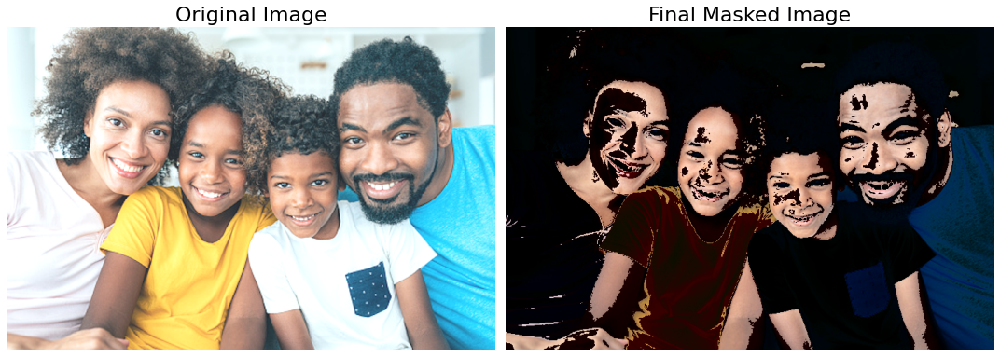

In [296]:
test2_brighter = cv2.convertScaleAbs(test2, beta=38)
finalSolution(test2_brighter)

Make the image 15% darker (100% is completely black)

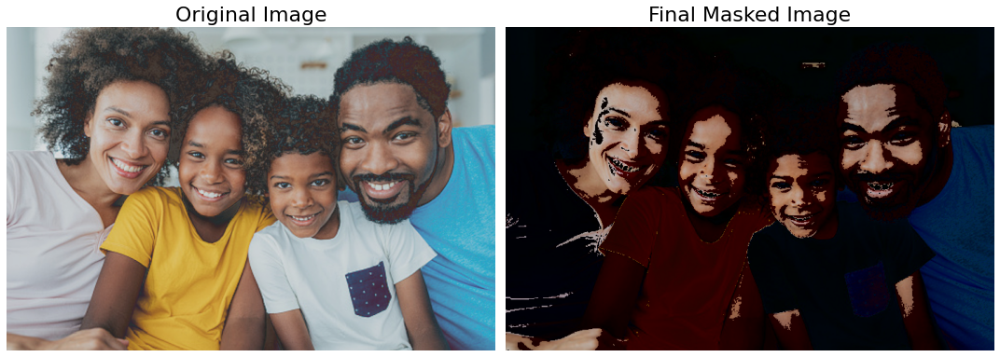

In [300]:
test2_darker = cv2.convertScaleAbs(test2, beta=-38)
finalSolution(test2_darker)

# Third Test


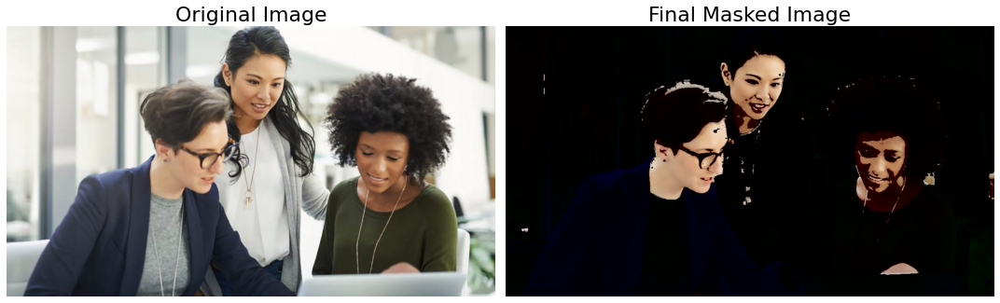

In [310]:
test3 = imread('/content/drive/MyDrive/images/lab1/test3.png')
finalSolution(test3)

Make the image 15% brighter (100% is completely white)



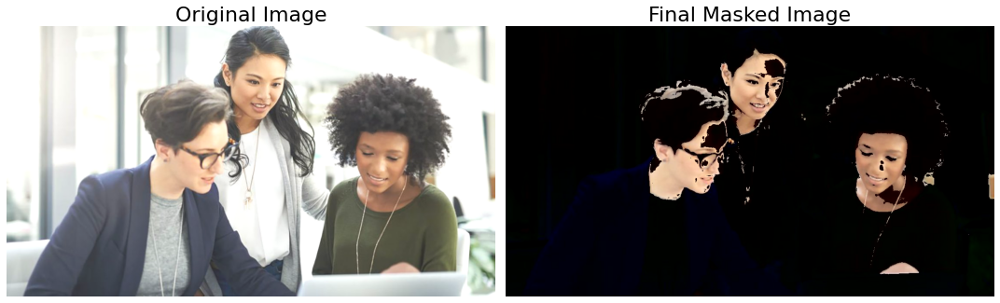

In [311]:
test3_brighter = cv2.convertScaleAbs(test3, beta=38)
finalSolution(test3_brighter)

Make the image 15% darker (100% is completely black)

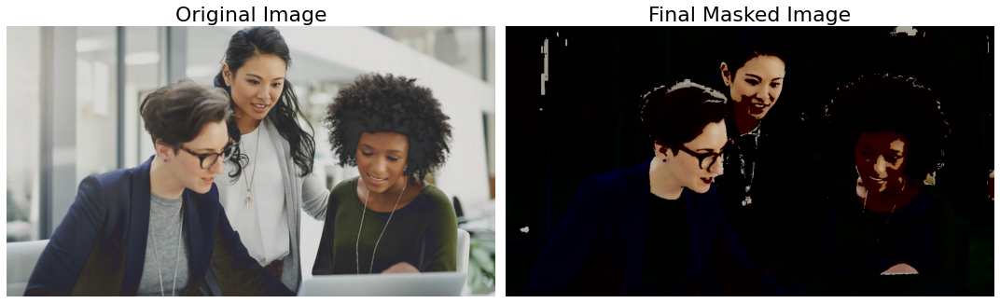

In [313]:
test3_darker = cv2.convertScaleAbs(test3, beta=-38)
finalSolution(test3_darker)